<a href="https://colab.research.google.com/github/ajaysuseel/MiniProject_AD/blob/main/contrastive_finetuning_blip2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/ajaysuseel/MiniProject_AD.git

Cloning into 'MiniProject_AD'...
remote: Enumerating objects: 98, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 98 (delta 19), reused 69 (delta 4), pack-reused 0 (from 0)
Receiving objects: 100% (98/98), 5.89 MiB | 20.12 MiB/s, done.
Resolving deltas: 100% (19/19), done.


In [ ]:
import os
import json
import math
import torch
from PIL import Image
import requests
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from transformers import BlipProcessor, BlipForConditionalGeneration, TrainingArguments, Trainer
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu
from peft import LoraConfig, get_peft_model



In [ ]:
# ====================================================
# Configurable Variables
# ====================================================
# Update these paths based on your Colab environment after cloning your repo.
LOCAL_REPO_PATH = "/content/MiniProject_AD/abhiram"  # Example local repo path
IMAGE_FOLDER = os.path.join(LOCAL_REPO_PATH, "images")
GROUND_TRUTH_JSON = os.path.join(LOCAL_REPO_PATH, "contrastive_captions.json")
MODEL_SAVE_PATH = "./models/finetuned_blip2"  # Directory to save the fine-tuned model

#Fine-Tuning Module

In [ ]:
from transformers import BlipConfig


MODEL_NAME = "Salesforce/blip2-flan-t5-xl"  # Your chosen BLIP-2 model

def load_blip2_with_lora():
    print("Loading BLIP-2 model and processor...")

    # Define configuration from the model checkpoint
    config = BlipConfig.from_pretrained(MODEL_NAME)

    # Load processor and model with ignore_mismatched_sizes to bypass size mismatches.
    processor = BlipProcessor.from_pretrained(MODEL_NAME, ignore_mismatched_sizes=True)#slight error,try in future to remove ignore_mismatched_sizes
    model = BlipForConditionalGeneration.from_pretrained(MODEL_NAME, config=config, ignore_mismatched_sizes=True)

    # Apply LoRA on all QKV modules in the vision encoder layers.
    target_modules = [f"vision_model.encoder.layers.{i}.self_attn.qkv" for i in range(12)]
    lora_config = LoraConfig(
        r=8,
        lora_alpha=16,
        lora_dropout=0.1,
        target_modules=target_modules
    )
    model = get_peft_model(model, lora_config)

    return model, processor

class ContrastiveCaptionDataset(Dataset):
    def __init__(self, data, processor, images_dir):
        self.data = data
        self.processor = processor
        self.images_dir = images_dir

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image_path = os.path.join(self.images_dir, item["filename"])
        try:
            image = Image.open(image_path).convert("RGB")
        except Exception as e:
            print(f"Error loading image {item['filename']}: {e}")
            return None

        # Tokenize positive caption using 'description'
        encoding = self.processor(
            text=item["description"],
            images=image,
            return_tensors="pt",
            padding="max_length",
            truncation=True
        )
        encoding = {k: v.squeeze(0) for k, v in encoding.items()}

        # Use input_ids directly for pos_labels and neg_labels
        encoding["pos_labels"] = encoding["input_ids"]
        encoding["neg_labels"] = torch.roll(encoding["input_ids"], shifts=1, dims=0)

        return encoding

def create_dataloader(data, processor, batch_size=2):
    dataset = ContrastiveCaptionDataset(data, processor, IMAGE_FOLDER)

    def collate_fn(batch):
        batch = [b for b in batch if b is not None]
        if not batch:
            return None
        keys = batch[0].keys()
        return {key: torch.stack([b[key] for b in batch]) for key in keys}

    return DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

def contrastive_loss(image_embeds, pos_text_embeds, neg_text_embeds, temperature=0.07):
    # Compute cosine similarities
    sim_pos = torch.cosine_similarity(image_embeds, pos_text_embeds, dim=-1)
    sim_neg = torch.cosine_similarity(image_embeds, neg_text_embeds, dim=-1)
    loss = -torch.log(torch.exp(sim_pos / temperature) / (torch.exp(sim_pos / temperature) + torch.exp(sim_neg / temperature)))
    return loss.mean()

#Training

In [ ]:
def train_blip_contrastive(model, dataloader, num_epochs=3, learning_rate=5e-5):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.train()

    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

    print(f"🚀 Starting fine-tuning on {device} for {num_epochs} epochs...")

    for epoch in range(num_epochs):
        epoch_loss = 0.0
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")
        for batch in progress_bar:
            optimizer.zero_grad()
            pixel_values = batch["pixel_values"].to(device)
            pos_input_ids = batch["pos_labels"].to(device)
            neg_input_ids = batch["neg_labels"].to(device)

            # Generate image embeddings from vision encoder
            image_embeds = model.vision_model(pixel_values).last_hidden_state.mean(dim=1)

            # Instead of using BERT encoder for text, use the text_decoder's forward method.
            # and get hidden states by accessing the 'hidden_states' attribute.
            # The hidden states are a tuple; we select the last one (-1).
            pos_outputs = model.text_decoder(input_ids=pos_input_ids.long(), output_hidden_states=True)
            neg_outputs = model.text_decoder(input_ids=neg_input_ids.long(), output_hidden_states=True)
            pos_text_embeds = pos_outputs.hidden_states[-1].mean(dim=1)  # Get last hidden state
            neg_text_embeds = neg_outputs.hidden_states[-1].mean(dim=1)  # Get last hidden state

            loss = contrastive_loss(image_embeds, pos_text_embeds, neg_text_embeds)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            progress_bar.set_postfix(loss=loss.item())

        print(f"✅ Epoch {epoch+1} completed | Average Loss: {epoch_loss/len(dataloader):.4f}")

    print("🎯 Fine-tuning complete!")
    # Save the fine-tuned model and processor
    model.save_pretrained(MODEL_SAVE_PATH)
    # Also save processor if needed
    processor.save_pretrained(MODEL_SAVE_PATH)
    print(f"Model saved to {MODEL_SAVE_PATH}")
    return model

#Evaluation Module

In [37]:
def load_ground_truth(local_json_path):
    try:
        with open(local_json_path, "r") as f:
            gt_data = json.load(f)
        # Convert the list to a dictionary using filenames as keys
        gt_data = {item["filename"]: item["description"] for item in gt_data}
        print(f"Loaded {len(gt_data)} ground truth captions from {local_json_path}.")
        return gt_data
    except Exception as e:
        print(f"Error loading ground truth captions: {e}")
        return {}

def load_image(image_path):
    try:
        image = Image.open(image_path).convert("RGB")
        return image
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

def generate_caption(model, processor, device, image):
    try:
        inputs = processor(images=image, return_tensors="pt").to(device) # Move inputs to device here
        # Remove the get_encoder call and pass inputs directly to generate
        with torch.no_grad():
            generated_ids = model.generate(**inputs)
        caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0] # Decode the generated IDs
        return caption
    except Exception as e:
        print(f"Error generating caption: {e}")
        return ""

def evaluate_model(image_folder, gt_json_path, model_path):
    gt_captions = load_ground_truth(gt_json_path)
    if not gt_captions:
        print("No ground truth data available. Exiting evaluation.")
        return

    model, processor, device = load_model_and_processor(model_path)
    if model is None:
        print("Model loading failed. Exiting evaluation.")
        return

    generated_captions = {}
    image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    print(f"Found {len(image_files)} images in {image_folder}.")

    # Generate captions for each image
    for filename in tqdm(image_files, desc="Evaluating images"):
        image_path = os.path.join(image_folder, filename)
        image = load_image(image_path)
        if image is None:
            continue
        caption = generate_caption(model, processor, device, image)
        generated_captions[filename] = caption

    individual_scores = {}
    references = []
    hypotheses = []

    # Display results and calculate BLEU scores
    for filename, gt_caption in gt_captions.items():
        if filename in generated_captions:
            gen_caption = generated_captions[filename]
            hypothesis = gen_caption.split()
            reference = [gt_caption.split()]  # BLEU expects a list of reference tokens
            score = sentence_bleu(reference, hypothesis)
            individual_scores[filename] = score
            references.append(reference)
            hypotheses.append(hypothesis)
            # Display the image with its captions and BLEU score
            image_path = os.path.join(image_folder, filename)
            display_image_with_captions(image_path, gt_caption, gen_caption, score)
        else:
            print(f"Warning: No generated caption for {filename}")

    avg_bleu = corpus_bleu(references, hypotheses)

    print("\n--- Evaluation Summary ---")
    for filename, score in individual_scores.items():
        print(f"{filename}: BLEU Score = {score:.4f}")
    print(f"\nAverage Corpus BLEU Score: {avg_bleu:.4f}")

# ====================================================

In [ ]:
# Define the load_model_and_processor function
def load_model_and_processor(model_path):
    """Loads the fine-tuned model and processor from the specified path."""
    try:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        # Use the BLIP-2 model name when loading:
        processor = BlipProcessor.from_pretrained(MODEL_NAME, ignore_mismatched_sizes=True)  # Assuming MODEL_NAME is 'Salesforce/blip2-flan-t5-xl'
        model = BlipForConditionalGeneration.from_pretrained(model_path, ignore_mismatched_sizes=True)  # Load from your fine-tuned path
        model.to(device)  # Move model to the appropriate device
        return model, processor, device
    except Exception as e:
        print(f"Error loading model and processor: {e}")
        return None, None, None

In [ ]:
import matplotlib.pyplot as plt
def display_image_with_captions(image_path, gt_caption, generated_caption, bleu_score):
    image = load_image(image_path)
    if image is None:
        print(f"Cannot display image: {image_path}")
        return
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.axis('off')
    title_text = f"GT: {gt_caption}\nGen: {generated_caption}\nBLEU: {bleu_score:.4f}"
    plt.title(title_text, fontsize=10)
    plt.show()

In [38]:
if __name__ == "__main__":
    # Clone your GitHub repository in Colab before running this script:
    # !git clone https://github.com/ajaysuseel/MiniProject_AD.git
    # Adjust paths as necessary
    # Load dataset for fine-tuning
    with open(os.path.join(LOCAL_REPO_PATH, "captions.json"), "r") as f:
        fine_tuning_data = json.load(f)
    print(f"Loaded {len(fine_tuning_data)} fine-tuning samples.")

    # Load BLIP-2 model with LoRA and processor
    model, processor = load_blip2_with_lora()
    # Create DataLoader for fine-tuning
    dataloader = create_dataloader(fine_tuning_data, processor, batch_size=2)

    # Fine-tune the model using contrastive fine-tuning
    model = train_blip_contrastive(model, dataloader, num_epochs=3, learning_rate=5e-5)



Loaded 10 fine-tuning samples.
Loading BLIP-2 model and processor...


You are using a model of type blip-2 to instantiate a model of type blip. This is not supported for all configurations of models and can yield errors.
The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'T5Tokenizer'. 
The class this function is called from is 'BertTokenizerFast'.
Some kwargs in processor config are unused and will not have any effect: num_query_tokens. 


KeyboardInterrupt: 

In [ ]:
IMAGE_FOLDER = os.path.join(LOCAL_REPO_PATH, "images")
GROUND_TRUTH_JSON = os.path.join(LOCAL_REPO_PATH, "captions.json")
MODEL_SAVE_PATH = "./models/finetuned_blip2"  # Directory to save the fine-tuned model

Loaded 10 ground truth captions from /content/MiniProject_AD/abhiram/captions.json.


The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'T5Tokenizer'. 
The class this function is called from is 'BertTokenizerFast'.
Some kwargs in processor config are unused and will not have any effect: num_query_tokens. 
You are using a model of type blip-2 to instantiate a model of type blip. This is not supported for all configurations of models and can yield errors.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of BlipForConditionalGeneration were not initialized from the model checkpoint at Salesforce/blip2-flan-t5-xl and are newly initialized: ['text_decoder.bert.embeddings.LayerNorm.bias', 'text_decoder.bert.embeddings.LayerNorm.weight', 'text_decoder.bert.embeddings.position_embeddings.weight', 'text_decoder.bert.embeddings.word_embeddings.weight', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.bias', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.weight', 'text_decoder.bert.encoder.layer.0.attention.output.dense.bias', 'text_decoder.bert.encoder.layer.0.attention.output.dense.weight', 'text_decoder.bert.encoder.layer.0.attention.self.key.bias', 'text_decoder.bert.encoder.layer.0.attention.self.key.weight', 'text_decoder.bert.encoder.layer.0.attention.self.query.bias', 'text_decoder.bert.encoder.layer.0.attention.self.query.weight', 'text_decoder.bert.encoder.layer.0.attention.self.value.bias', 'text_decoder.bert.encoder.layer.0.attention.self.va

Found 10 images in /content/MiniProject_AD/abhiram/images.


Evaluating images:  40%|████      | 4/10 [00:00<00:00, 30.21it/s]

Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'


Evaluating images: 100%|██████████| 10/10 [00:00<00:00, 33.27it/s]


Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'


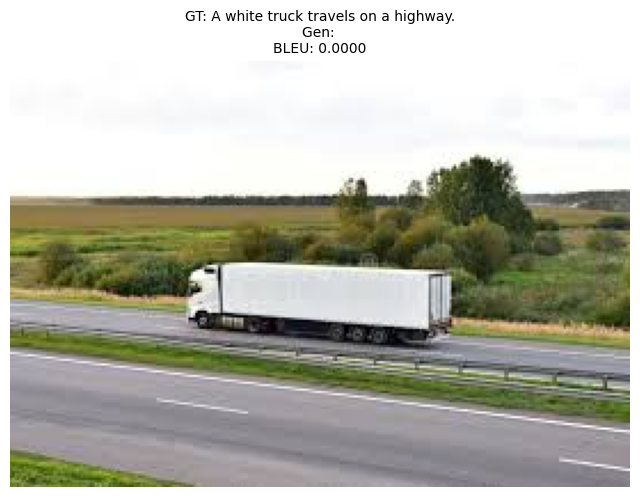

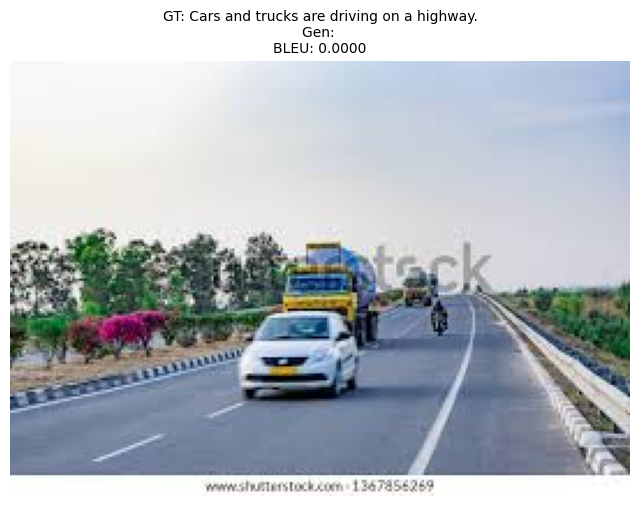

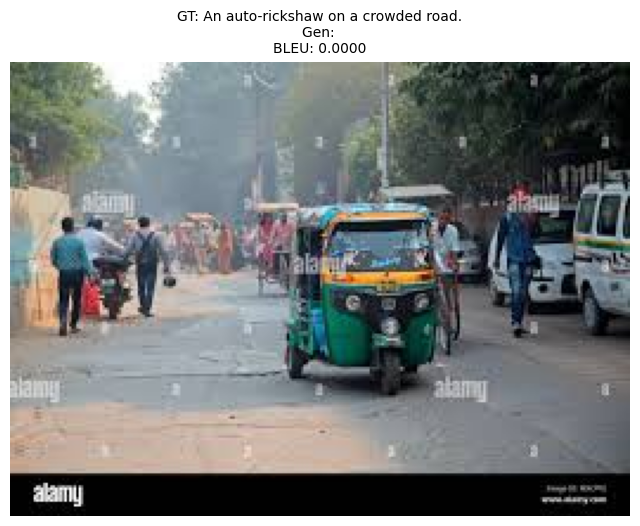

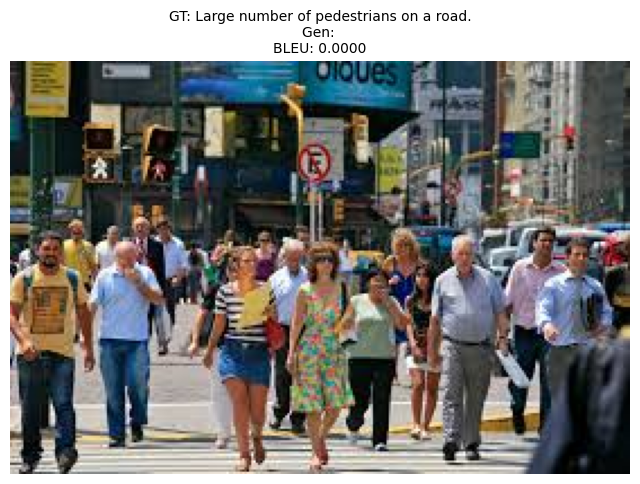

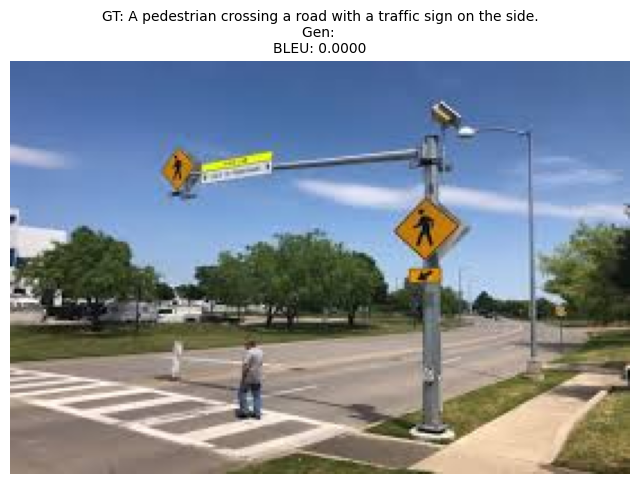

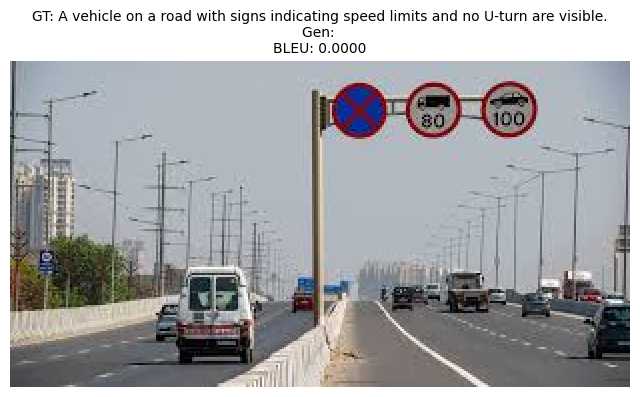

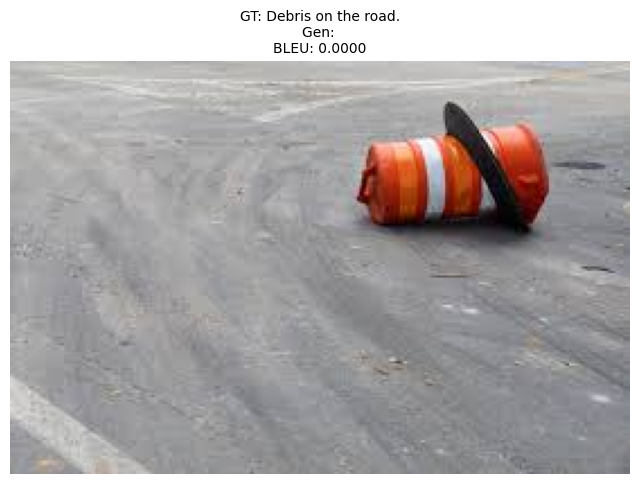

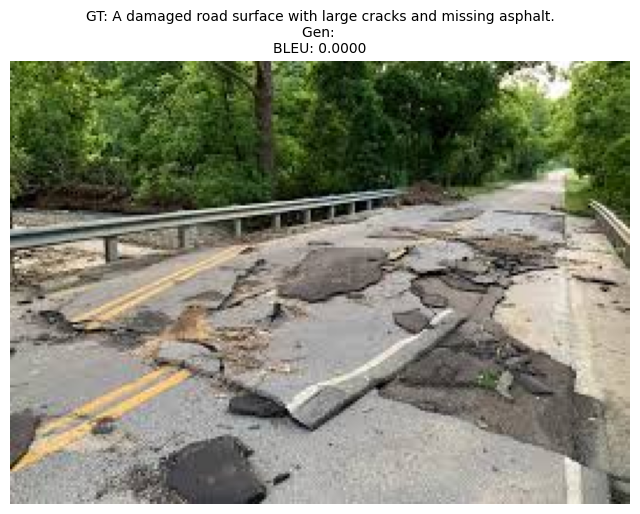

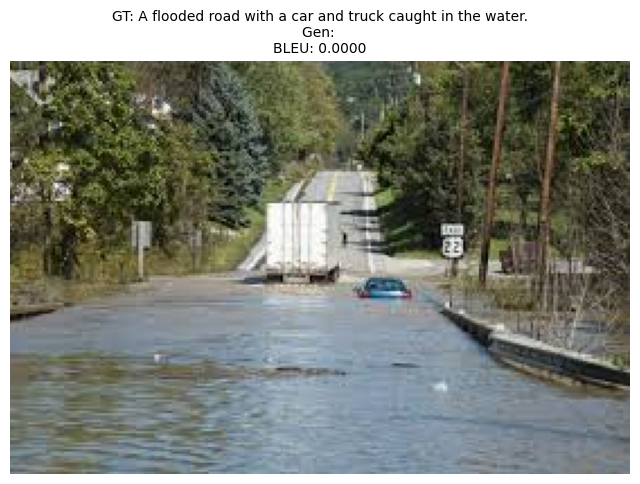

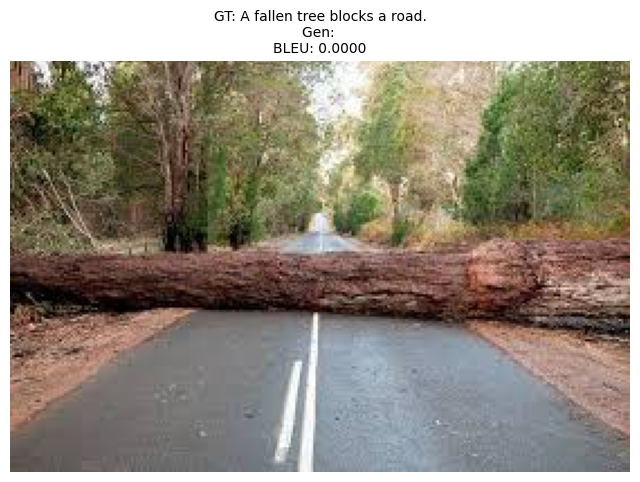


--- Evaluation Summary ---
file61.jpg: BLEU Score = 0.0000
file62.jpg: BLEU Score = 0.0000
file63.jpg: BLEU Score = 0.0000
file64.jpg: BLEU Score = 0.0000
file65.jpg: BLEU Score = 0.0000
file66.jpg: BLEU Score = 0.0000
file67.jpg: BLEU Score = 0.0000
file68.jpg: BLEU Score = 0.0000
file69.jpg: BLEU Score = 0.0000
file70.jpg: BLEU Score = 0.0000

Average Corpus BLEU Score: 0.0000


In [39]:
evaluate_model(IMAGE_FOLDER, GROUND_TRUTH_JSON, MODEL_SAVE_PATH)

#Eval 2


In [48]:
import os
import json
import torch
from PIL import Image
import matplotlib.pyplot as plt
from transformers import BlipProcessor, BlipForConditionalGeneration
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu
from tqdm import tqdm

# ====================================================
# Configurable Variables
# ====================================================
LOCAL_REPO_PATH = "/content/MiniProject_AD/abhiram"  # Adjust according to your cloned repo
IMAGE_FOLDER = os.path.join(LOCAL_REPO_PATH, "images")
GROUND_TRUTH_JSON = os.path.join(LOCAL_REPO_PATH, "captions.json")
MODEL_PATH = "./models/finetuned_blip2"  # Directory where your fine-tuned BLIP-2 model is saved

# ====================================================
# Function: Load Ground Truth Captions from Local JSON
# ====================================================
def load_ground_truth(local_json_path):
    try:
        with open(local_json_path, "r") as f:
            gt_data = json.load(f)
        # Convert the list to a dictionary using filenames as keys
        gt_data = {item["filename"]: item["description"] for item in gt_data} # This line transforms the list into a dictionary
        print(f"Loaded {len(gt_data)} ground truth captions from {local_json_path}.")
        return gt_data
    except Exception as e:
        print(f"Error loading ground truth captions: {e}")
        return {}

# ====================================================
# Function: Load an Image from Local Path
# ====================================================
def load_image(image_path):
    try:
        image = Image.open(image_path).convert("RGB")
        return image
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

# ====================================================
# Function: Load Fine-Tuned BLIP-2 Model and Processor
# ====================================================
def load_model_and_processor(model_path):
    try:
        processor = BlipProcessor.from_pretrained(model_path,ignore_mismatched_sizes=True)
        model = BlipForConditionalGeneration.from_pretrained(model_path,ignore_mismatched_sizes=True)
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model.to(device)
        model.eval()
        print(f"Model loaded on {device}.")
        return model, processor, device
    except Exception as e:
        print(f"Error loading model: {e}")
        return None, None, None

# ====================================================
# Function: Generate Caption using BLIP-2
# ====================================================
def generate_caption(model, processor, device, image):
    try:
        inputs = processor(images=image, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}
        with torch.no_grad():
            output_ids = model.generate(**inputs)
        caption = processor.decode(output_ids[0], skip_special_tokens=True)
        return caption
    except Exception as e:
        print(f"Error generating caption: {e}")
        return ""

# ====================================================
# Function: Display Image with Ground Truth and Generated Captions
# ====================================================
def display_image_with_captions(image_path, gt_caption, generated_caption, bleu_score):
    image = load_image(image_path)
    if image is None:
        print(f"Cannot display image: {image_path}")
        return
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.axis('off')
    title_text = f"GT: {gt_caption}\nGen: {generated_caption}\nBLEU: {bleu_score:.4f}"
    plt.title(title_text, fontsize=10)
    plt.show()

# ====================================================
# Function: Evaluate Model on Dataset and Display Results
# ====================================================
def evaluate_model(image_folder, gt_json_path, model_path):
    gt_captions = load_ground_truth(gt_json_path)
    if not gt_captions:
        print("No ground truth data available. Exiting evaluation.")
        return

    model, processor, device = load_model_and_processor(model_path)
    if model is None:
        print("Model loading failed. Exiting evaluation.")
        return

    generated_captions = {}
    image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    print(f"Found {len(image_files)} images in {image_folder}.")

    # Generate captions for each image
    for filename in tqdm(image_files, desc="Evaluating images"):
        image_path = os.path.join(image_folder, filename)
        image = load_image(image_path)
        if image is None:
            continue
        caption = generate_caption(model, processor, device, image)
        generated_captions[filename] = caption

    individual_scores = {}
    references = []
    hypotheses = []

    # Evaluate and display results for each image
    for filename, gt_caption in gt_captions.items():
        if filename in generated_captions:
            gen_caption = generated_captions[filename]
            hypothesis = gen_caption.split()
            reference = [gt_caption.split()]  # BLEU expects a list of references
            score = sentence_bleu(reference, hypothesis)
            individual_scores[filename] = score
            references.append(reference)
            hypotheses.append(hypothesis)
            image_path = os.path.join(image_folder, filename)
            display_image_with_captions(image_path, gt_caption, gen_caption, score)
        else:
            print(f"Warning: No generated caption for {filename}")

    avg_bleu = corpus_bleu(references, hypotheses)
    print("\n--- Evaluation Summary ---")
    for filename, score in individual_scores.items():
        print(f"{filename}: BLEU Score = {score:.4f}")
    print(f"\nAverage Corpus BLEU Score: {avg_bleu:.4f}")


Loaded 10 fine-tuning samples.
Loading BLIP-2 model and processor...


You are using a model of type blip-2 to instantiate a model of type blip. This is not supported for all configurations of models and can yield errors.
The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'T5Tokenizer'. 
The class this function is called from is 'BertTokenizerFast'.
Some kwargs in processor config are unused and will not have any effect: num_query_tokens. 


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of BlipForConditionalGeneration were not initialized from the model checkpoint at Salesforce/blip2-flan-t5-xl and are newly initialized: ['text_decoder.bert.embeddings.LayerNorm.bias', 'text_decoder.bert.embeddings.LayerNorm.weight', 'text_decoder.bert.embeddings.position_embeddings.weight', 'text_decoder.bert.embeddings.word_embeddings.weight', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.bias', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.weight', 'text_decoder.bert.encoder.layer.0.attention.output.dense.bias', 'text_decoder.bert.encoder.layer.0.attention.output.dense.weight', 'text_decoder.bert.encoder.layer.0.attention.self.key.bias', 'text_decoder.bert.encoder.layer.0.attention.self.key.weight', 'text_decoder.bert.encoder.layer.0.attention.self.query.bias', 'text_decoder.bert.encoder.layer.0.attention.self.query.weight', 'text_decoder.bert.encoder.layer.0.attention.self.value.bias', 'text_decoder.bert.encoder.layer.0.attention.self.va

Loaded 10 ground truth captions from /content/MiniProject_AD/abhiram/captions.json.


You are using a model of type blip-2 to instantiate a model of type blip. This is not supported for all configurations of models and can yield errors.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of BlipForConditionalGeneration were not initialized from the model checkpoint at Salesforce/blip2-flan-t5-xl and are newly initialized: ['text_decoder.bert.embeddings.LayerNorm.bias', 'text_decoder.bert.embeddings.LayerNorm.weight', 'text_decoder.bert.embeddings.position_embeddings.weight', 'text_decoder.bert.embeddings.word_embeddings.weight', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.bias', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.weight', 'text_decoder.bert.encoder.layer.0.attention.output.dense.bias', 'text_decoder.bert.encoder.layer.0.attention.output.dense.weight', 'text_decoder.bert.encoder.layer.0.attention.self.key.bias', 'text_decoder.bert.encoder.layer.0.attention.self.key.weight', 'text_decoder.bert.encoder.layer.0.attention.self.query.bias', 'text_decoder.bert.encoder.layer.0.attention.self.query.weight', 'text_decoder.bert.encoder.layer.0.attention.self.value.bias', 'text_decoder.bert.encoder.layer.0.attention.self.va

Model loaded on cuda.
Found 10 images in /content/MiniProject_AD/abhiram/images.


Evaluating images:  30%|███       | 3/10 [00:00<00:00, 28.30it/s]

Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'


Evaluating images:  70%|███████   | 7/10 [00:00<00:00, 30.51it/s]

Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'


Evaluating images: 100%|██████████| 10/10 [00:00<00:00, 32.49it/s]

Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'


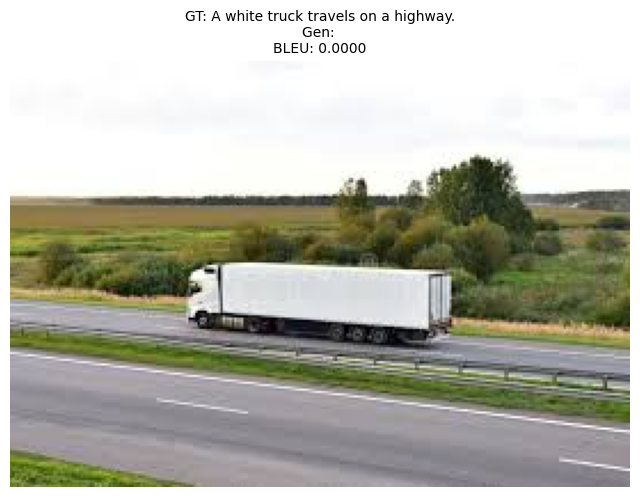

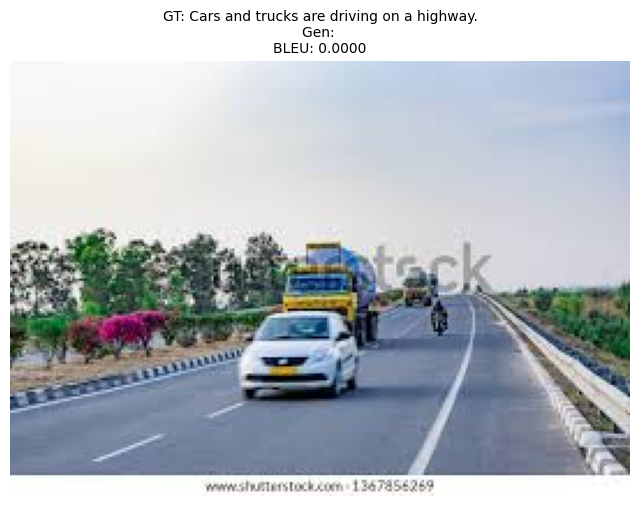

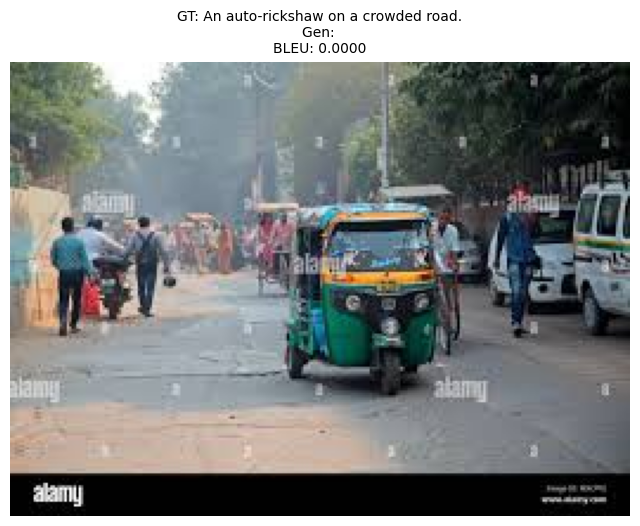

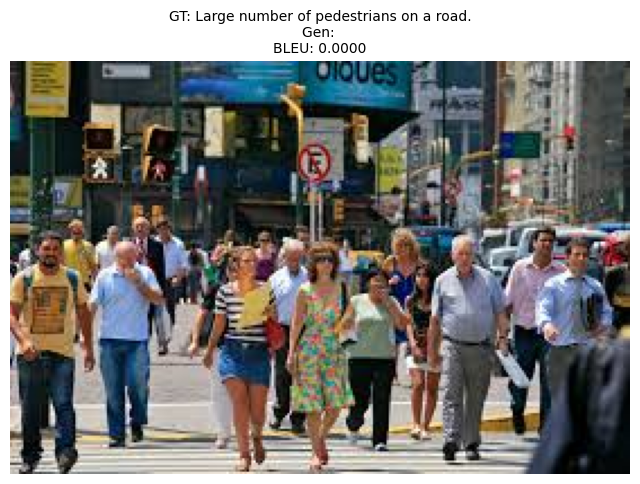

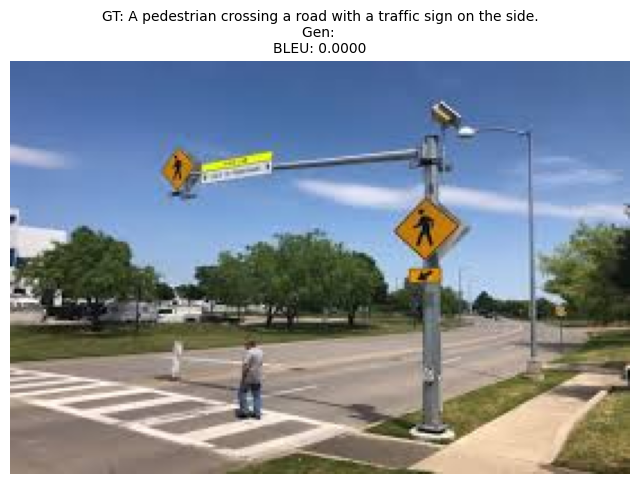

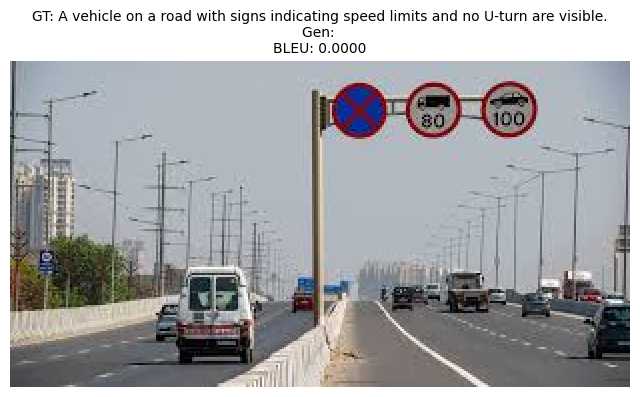

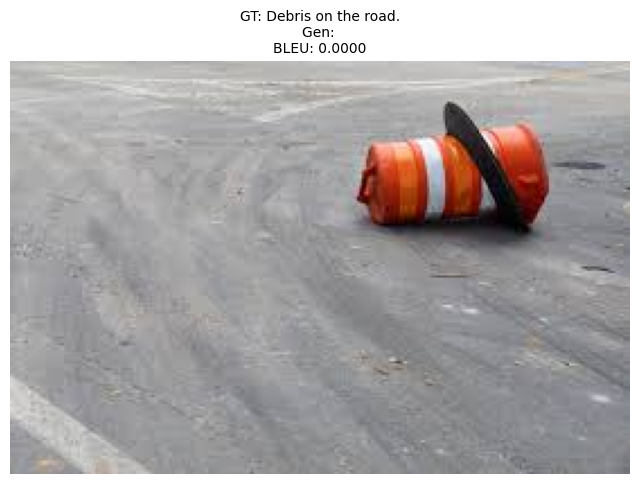

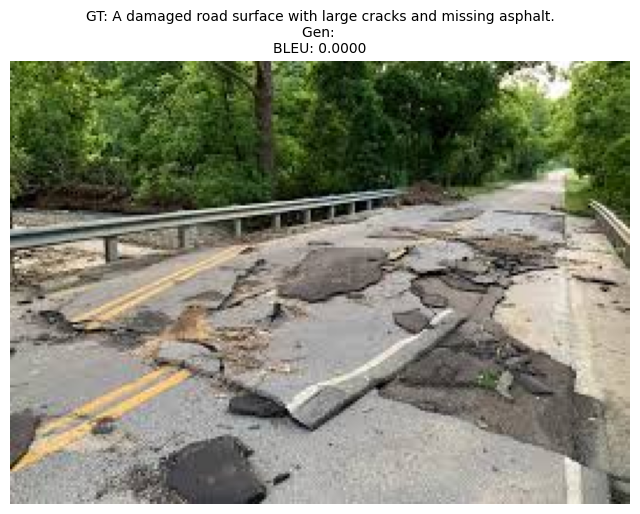

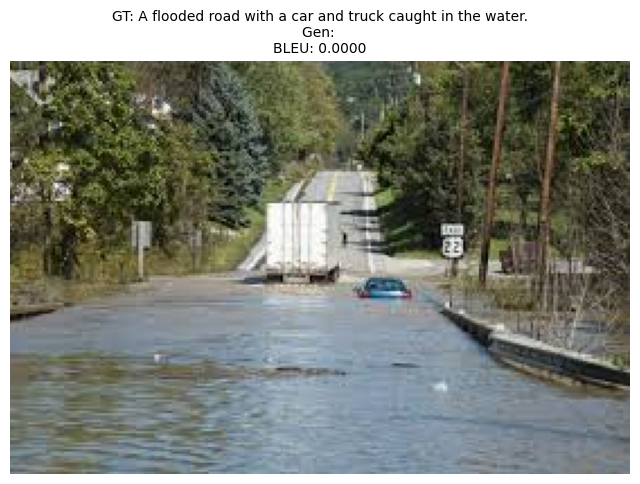

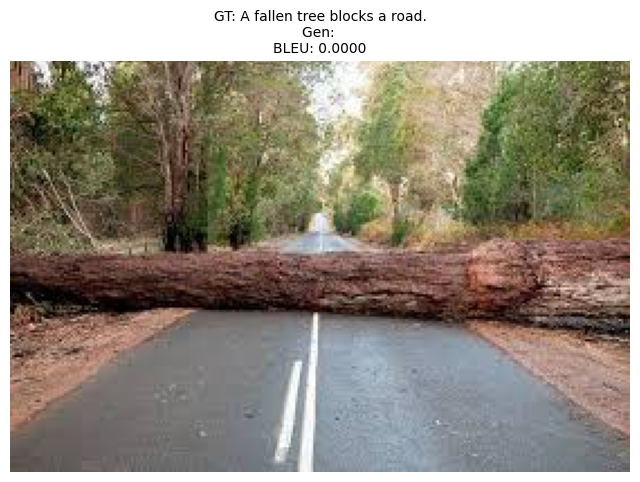


--- Evaluation Summary ---
file61.jpg: BLEU Score = 0.0000
file62.jpg: BLEU Score = 0.0000
file63.jpg: BLEU Score = 0.0000
file64.jpg: BLEU Score = 0.0000
file65.jpg: BLEU Score = 0.0000
file66.jpg: BLEU Score = 0.0000
file67.jpg: BLEU Score = 0.0000
file68.jpg: BLEU Score = 0.0000
file69.jpg: BLEU Score = 0.0000
file70.jpg: BLEU Score = 0.0000

Average Corpus BLEU Score: 0.0000


In [49]:
# Main Execution: Fine-Tuning then Evaluation
# ====================================================
if __name__ == "__main__":
    # Ensure your repository is cloned in Colab, for example:
    # !git clone https://github.com/ajaysuseel/MiniProject_AD.git
    # and LOCAL_REPO_PATH is updated accordingly.

    # Fine-tuning part:
    with open(os.path.join(LOCAL_REPO_PATH, "captions.json"), "r") as f:
        fine_tuning_data = json.load(f)
    print(f"Loaded {len(fine_tuning_data)} fine-tuning samples.")

    # Load BLIP-2 model with LoRA and processor
    # (Assumes you have already fine-tuned the model and saved it to MODEL_SAVE_PATH)
    # If not, run your fine-tuning process first.
    model, processor = load_blip2_with_lora()
    # Here, you should create a DataLoader and run fine-tuning.
    # For this example, we'll assume the model is already fine-tuned and saved.

    # Evaluate the fine-tuned model
    evaluate_model(IMAGE_FOLDER, GROUND_TRUTH_JSON, MODEL_SAVE_PATH)

In [56]:
# !git clone https://github.com/ajaysuseel/MiniProject_AD.git

import os
import json
import math
import torch
from PIL import Image
import requests
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from transformers import BlipProcessor, BlipForConditionalGeneration, BlipConfig
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu
from peft import LoraConfig, get_peft_model
import matplotlib.pyplot as plt

# ====================================================
# Configurable Variables
# ====================================================
# Update these paths based on your Colab environment
LOCAL_REPO_PATH = "/content/MiniProject_AD/abhiram"  # Local repository path after cloning
IMAGE_FOLDER = os.path.join(LOCAL_REPO_PATH, "images")
GROUND_TRUTH_JSON = os.path.join(LOCAL_REPO_PATH, "contrastive_captions.json")  # Ground truth captions file
MODEL_SAVE_PATH = "./models/finetuned2_blip2"  # Directory to save the fine-tuned model
MODEL_NAME = "Salesforce/blip2-flan-t5-xl"      # BLIP-2 model identifier

# ====================================================
# Fine-Tuning Module: Load BLIP‑2 with LoRA
# ====================================================
def load_blip2_with_lora():
    print("Loading BLIP-2 model and processor...")
    config = BlipConfig.from_pretrained(MODEL_NAME)
    processor = BlipProcessor.from_pretrained(MODEL_NAME, ignore_mismatched_sizes=True)
    model = BlipForConditionalGeneration.from_pretrained(MODEL_NAME, config=config, ignore_mismatched_sizes=True)

    # Apply LoRA only to the vision encoder's QKV modules.
    target_modules = [f"vision_model.encoder.layers.{i}.self_attn.qkv" for i in range(12)]
    lora_config = LoraConfig(
        r=8,
        lora_alpha=16,
        lora_dropout=0.1,
        target_modules=target_modules
    )
    model = get_peft_model(model, lora_config)

    # Freeze the text_decoder to avoid modifying it or calling unsupported methods.
    for param in model.text_decoder.parameters():
        param.requires_grad = False

    return model, processor


# ====================================================
# Contrastive Caption Dataset for Fine-Tuning
# ====================================================
class ContrastiveCaptionDataset(Dataset):
    def __init__(self, data, processor, images_dir):
        """
        data: a list of dictionaries with keys "filename" and "description"
        (Here, we use the "description" as the positive caption. A negative sample is created by rolling tokens.)
        """
        self.data = data
        self.processor = processor
        self.images_dir = images_dir

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image_path = os.path.join(self.images_dir, item["filename"])
        try:
            image = Image.open(image_path).convert("RGB")
        except Exception as e:
            print(f"Error loading image {item['filename']}: {e}")
            return None

        # Tokenize positive caption using the "description" key
        pos_encoding = self.processor(
            text=item["description"],
            images=image,
            return_tensors="pt",
            padding="max_length",
            truncation=True
        )
        pos_encoding = {k: v.squeeze(0) for k, v in pos_encoding.items()}
        # For contrastive loss, use the positive caption as labels and create a negative sample by rolling the tokens.
        pos_encoding["pos_labels"] = pos_encoding["input_ids"]
        pos_encoding["neg_labels"] = torch.roll(pos_encoding["input_ids"], shifts=1, dims=0)
        return pos_encoding

def create_dataloader(data, processor, batch_size=2):
    dataset = ContrastiveCaptionDataset(data, processor, IMAGE_FOLDER)
    def collate_fn(batch):
        batch = [b for b in batch if b is not None]
        if not batch:
            return None
        keys = batch[0].keys()
        return {key: torch.stack([b[key] for b in batch]) for key in keys}
    return DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

# ====================================================
# Contrastive Loss Function
# ====================================================
def contrastive_loss(image_embeds, pos_text_embeds, neg_text_embeds, temperature=0.07):
    sim_pos = torch.cosine_similarity(image_embeds, pos_text_embeds, dim=-1)
    sim_neg = torch.cosine_similarity(image_embeds, neg_text_embeds, dim=-1)
    loss = -torch.log(torch.exp(sim_pos / temperature) / (torch.exp(sim_pos / temperature) + torch.exp(sim_neg / temperature)))
    return loss.mean()

# ====================================================
# Training: Contrastive Fine-Tuning of BLIP‑2
# ====================================================
def train_blip_contrastive(model, dataloader, num_epochs=3, learning_rate=5e-5):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.train()
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

    print(f"🚀 Starting fine-tuning on {device} for {num_epochs} epochs...")
    for epoch in range(num_epochs):
        epoch_loss = 0.0
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")
        for batch in progress_bar:
            optimizer.zero_grad()
            # Move batch inputs to device
            pixel_values = batch["pixel_values"].to(device)
            pos_input_ids = batch["pos_labels"].to(device)
            neg_input_ids = batch["neg_labels"].to(device)

            # Generate image embeddings using the vision encoder
            image_embeds = model.vision_model(pixel_values).last_hidden_state.mean(dim=1)
            # For text embeddings, use the text_decoder's generation (T5-based) via its generate() method
            # In contrastive training, we want to extract text embeddings without calling get_encoder.
            # Here, we use the text_decoder directly with output_hidden_states=True.
            with torch.no_grad():
                pos_outputs = model.text_decoder(input_ids=pos_input_ids.long(), output_hidden_states=True)
                neg_outputs = model.text_decoder(input_ids=neg_input_ids.long(), output_hidden_states=True)
            pos_text_embeds = pos_outputs.hidden_states[-1].mean(dim=1)
            neg_text_embeds = neg_outputs.hidden_states[-1].mean(dim=1)

            loss = contrastive_loss(image_embeds, pos_text_embeds, neg_text_embeds)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            progress_bar.set_postfix(loss=loss.item())
        print(f"✅ Epoch {epoch+1} completed | Average Loss: {epoch_loss/len(dataloader):.4f}")

    print("🎯 Fine-tuning complete!")
    model.save_pretrained(MODEL_SAVE_PATH)
    processor.save_pretrained(MODEL_SAVE_PATH)
    print(f"Model saved to {MODEL_SAVE_PATH}")
    return model

# ====================================================
# Evaluation Module: Display and Compute BLEU Scores
# ====================================================
def load_ground_truth(local_json_path):
    try:
        with open(local_json_path, "r") as f:
            gt_data = json.load(f)
        # Convert the list to a dictionary using filenames as keys
        gt_data = {item["filename"]: item["description"] for item in gt_data}
        print(f"Loaded {len(gt_data)} ground truth captions from {local_json_path}.")
        return gt_data
    except Exception as e:
        print(f"Error loading ground truth captions: {e}")
        return {}

def load_image(image_path):
    try:
        image = Image.open(image_path).convert("RGB")
        return image
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

def generate_caption(model, processor, device, image):
    try:
        inputs = processor(images=image, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}
        with torch.no_grad():
            generated_ids = model.generate(**inputs)
        # Use batch_decode to handle multiple tokens and skip special tokens
        caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
        return caption
    except Exception as e:
        print(f"Error generating caption: {e}")
        return ""

def load_model_and_processor(model_path):
    try:
        processor = BlipProcessor.from_pretrained(model_path, ignore_mismatched_sizes=True)
        model = BlipForConditionalGeneration.from_pretrained(model_path, ignore_mismatched_sizes=True)
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model.to(device)
        model.eval()
        print(f"Model loaded on {device}.")
        return model, processor, device
    except Exception as e:
        print(f"Error loading model: {e}")
        return None, None, None

def display_image_with_captions(image_path, gt_caption, generated_caption, bleu_score):
    image = load_image(image_path)
    if image is None:
        print(f"Cannot display image: {image_path}")
        return
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.axis('off')
    title_text = f"GT: {gt_caption}\nGen: {generated_caption}\nBLEU: {bleu_score:.4f}"
    plt.title(title_text, fontsize=10)
    plt.show()

def evaluate_model(image_folder, gt_json_path, model_path):
    gt_captions = load_ground_truth(gt_json_path)
    if not gt_captions:
        print("No ground truth data available. Exiting evaluation.")
        return

    model, processor, device = load_model_and_processor(model_path)
    if model is None:
        print("Model loading failed. Exiting evaluation.")
        return

    generated_captions = {}
    image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    print(f"Found {len(image_files)} images in {image_folder}.")

    for filename in tqdm(image_files, desc="Evaluating images"):
        image_path = os.path.join(image_folder, filename)
        image = load_image(image_path)
        if image is None:
            continue
        caption = generate_caption(model, processor, device, image)
        generated_captions[filename] = caption

    individual_scores = {}
    references = []
    hypotheses = []

    for filename, gt_caption in gt_captions.items():
        if filename in generated_captions:
            gen_caption = generated_captions[filename]
            hypothesis = gen_caption.split()
            reference = [gt_caption.split()]
            score = sentence_bleu(reference, hypothesis)
            individual_scores[filename] = score
            references.append(reference)
            hypotheses.append(hypothesis)
            image_path = os.path.join(image_folder, filename)
            display_image_with_captions(image_path, gt_caption, gen_caption, score)
        else:
            print(f"Warning: No generated caption for {filename}")

    avg_bleu = corpus_bleu(references, hypotheses)
    print("\n--- Evaluation Summary ---")
    for filename, score in individual_scores.items():
        print(f"{filename}: BLEU Score = {score:.4f}")
    print(f"\nAverage Corpus BLEU Score: {avg_bleu:.4f}")

In [57]:
if __name__ == "__main__":
    # Ensure your repository is cloned and LOCAL_REPO_PATH is set correctly.
    with open(os.path.join(LOCAL_REPO_PATH, "captions.json"), "r") as f:
        fine_tuning_data = json.load(f)
    print(f"Loaded {len(fine_tuning_data)} fine-tuning samples.")

    # Load BLIP-2 model with LoRA and processor for fine-tuning
    model, processor = load_blip2_with_lora()
    dataloader = create_dataloader(fine_tuning_data, processor, batch_size=2)

    # Fine-tune the model using contrastive fine-tuning
    model = train_blip_contrastive(model, dataloader, num_epochs=3, learning_rate=5e-5)



Loaded 10 fine-tuning samples.
Loading BLIP-2 model and processor...


You are using a model of type blip-2 to instantiate a model of type blip. This is not supported for all configurations of models and can yield errors.
The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'T5Tokenizer'. 
The class this function is called from is 'BertTokenizerFast'.
Some kwargs in processor config are unused and will not have any effect: num_query_tokens. 


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of BlipForConditionalGeneration were not initialized from the model checkpoint at Salesforce/blip2-flan-t5-xl and are newly initialized: ['text_decoder.bert.embeddings.LayerNorm.bias', 'text_decoder.bert.embeddings.LayerNorm.weight', 'text_decoder.bert.embeddings.position_embeddings.weight', 'text_decoder.bert.embeddings.word_embeddings.weight', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.bias', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.weight', 'text_decoder.bert.encoder.layer.0.attention.output.dense.bias', 'text_decoder.bert.encoder.layer.0.attention.output.dense.weight', 'text_decoder.bert.encoder.layer.0.attention.self.key.bias', 'text_decoder.bert.encoder.layer.0.attention.self.key.weight', 'text_decoder.bert.encoder.layer.0.attention.self.query.bias', 'text_decoder.bert.encoder.layer.0.attention.self.query.weight', 'text_decoder.bert.encoder.layer.0.attention.self.value.bias', 'text_decoder.bert.encoder.layer.0.attention.self.va

🚀 Starting fine-tuning on cuda for 3 epochs...


Epoch 1/3: 100%|██████████| 5/5 [00:01<00:00,  4.72it/s, loss=0.694]


✅ Epoch 1 completed | Average Loss: 0.7000


Epoch 2/3: 100%|██████████| 5/5 [00:01<00:00,  4.98it/s, loss=0.7]


✅ Epoch 2 completed | Average Loss: 0.6971


Epoch 3/3: 100%|██████████| 5/5 [00:01<00:00,  4.94it/s, loss=0.689]


✅ Epoch 3 completed | Average Loss: 0.6938
🎯 Fine-tuning complete!
Model saved to ./models/finetuned2_blip2


In [58]:
GROUND_TRUTH_JSON = os.path.join(LOCAL_REPO_PATH, "captions.json")

Loaded 10 ground truth captions from /content/MiniProject_AD/abhiram/captions.json.


You are using a model of type blip-2 to instantiate a model of type blip. This is not supported for all configurations of models and can yield errors.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of BlipForConditionalGeneration were not initialized from the model checkpoint at Salesforce/blip2-flan-t5-xl and are newly initialized: ['text_decoder.bert.embeddings.LayerNorm.bias', 'text_decoder.bert.embeddings.LayerNorm.weight', 'text_decoder.bert.embeddings.position_embeddings.weight', 'text_decoder.bert.embeddings.word_embeddings.weight', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.bias', 'text_decoder.bert.encoder.layer.0.attention.output.LayerNorm.weight', 'text_decoder.bert.encoder.layer.0.attention.output.dense.bias', 'text_decoder.bert.encoder.layer.0.attention.output.dense.weight', 'text_decoder.bert.encoder.layer.0.attention.self.key.bias', 'text_decoder.bert.encoder.layer.0.attention.self.key.weight', 'text_decoder.bert.encoder.layer.0.attention.self.query.bias', 'text_decoder.bert.encoder.layer.0.attention.self.query.weight', 'text_decoder.bert.encoder.layer.0.attention.self.value.bias', 'text_decoder.bert.encoder.layer.0.attention.self.va

Model loaded on cuda.
Found 10 images in /content/MiniProject_AD/abhiram/images.


Evaluating images:  40%|████      | 4/10 [00:00<00:00, 33.40it/s]

Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'


Evaluating images: 100%|██████████| 10/10 [00:00<00:00, 36.10it/s]


Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'
Error generating caption: 'BlipTextLMHeadModel' object has no attribute 'get_encoder'


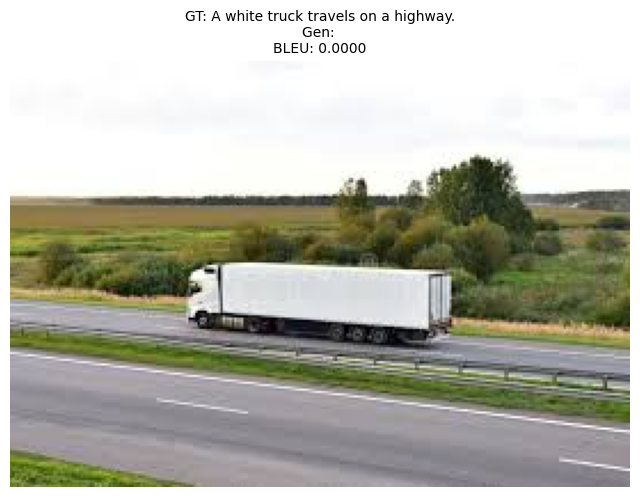

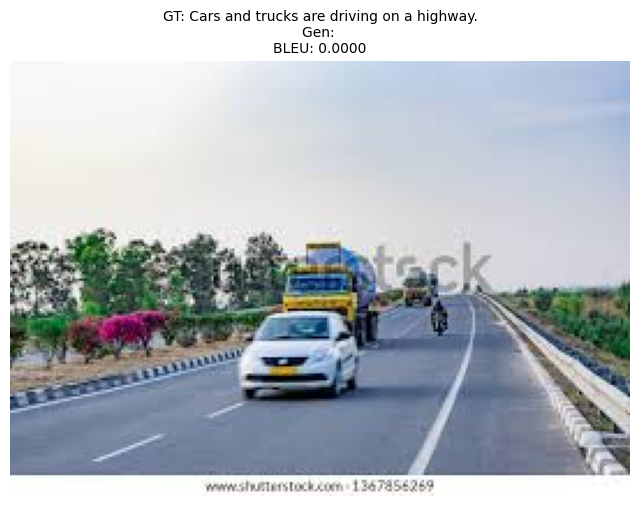

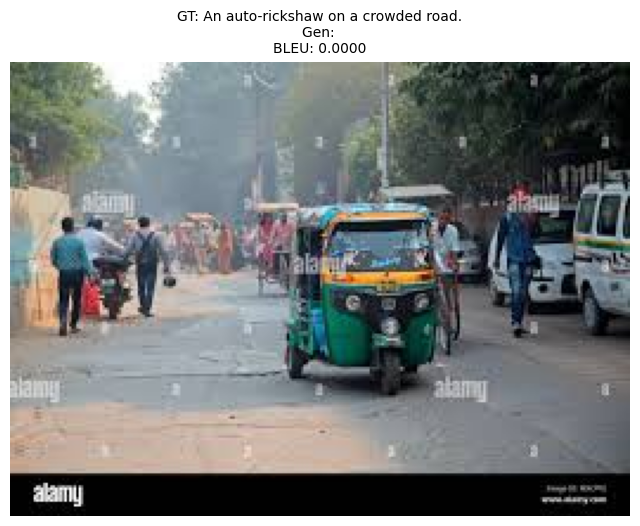

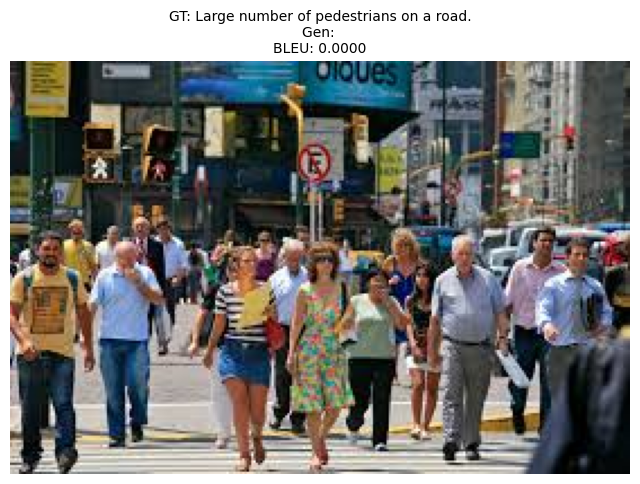

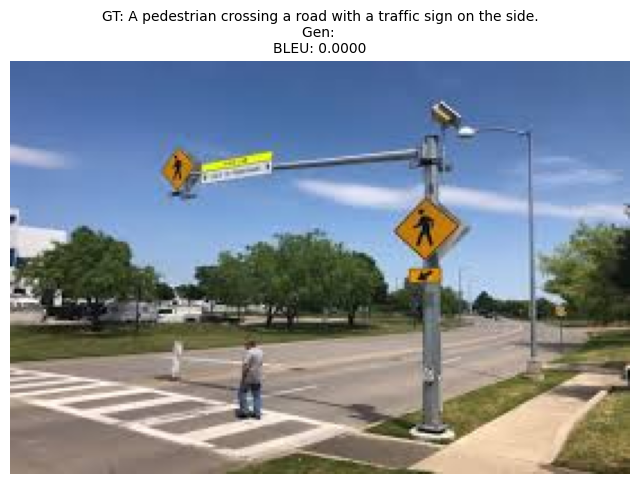

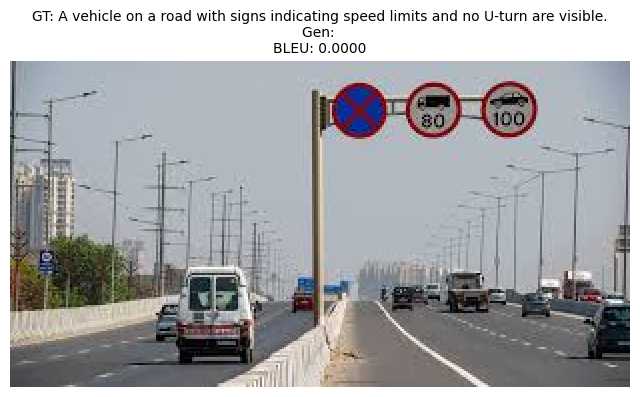

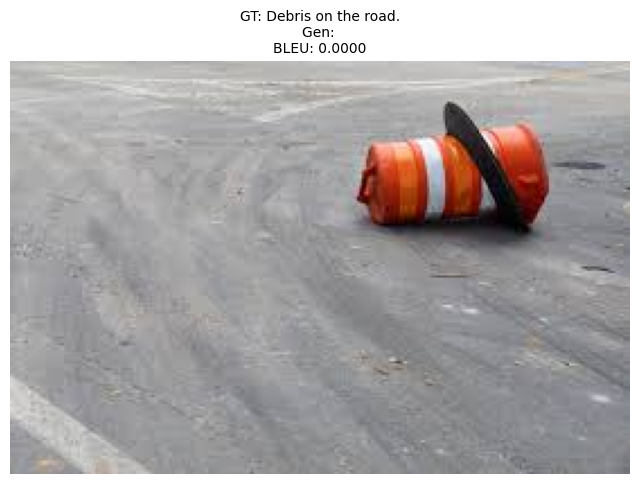

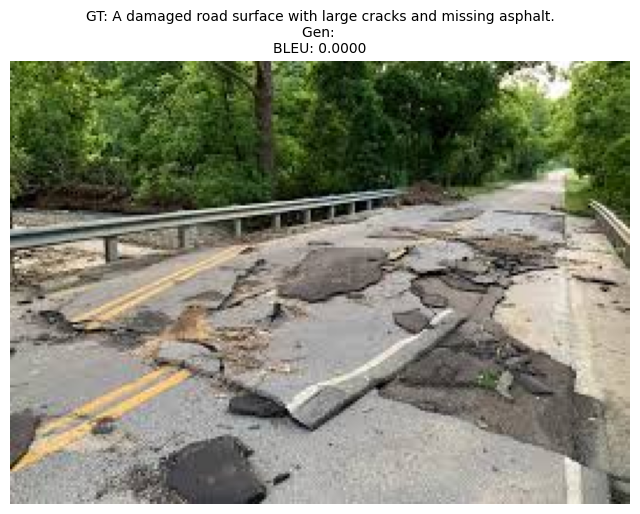

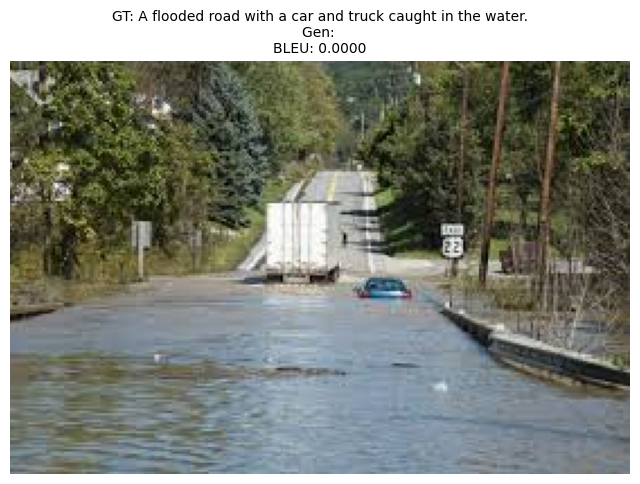

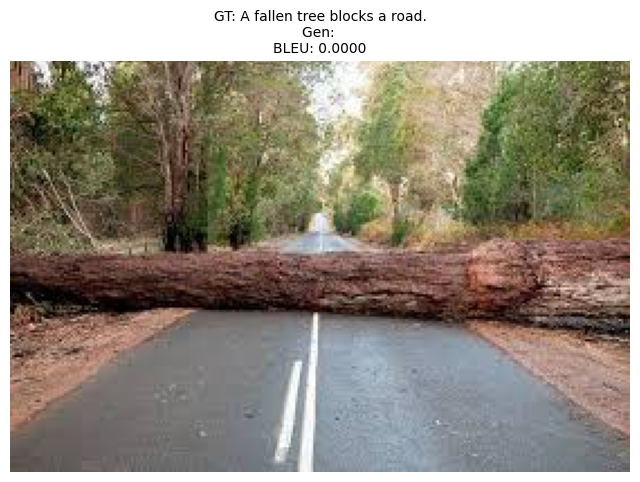


--- Evaluation Summary ---
file61.jpg: BLEU Score = 0.0000
file62.jpg: BLEU Score = 0.0000
file63.jpg: BLEU Score = 0.0000
file64.jpg: BLEU Score = 0.0000
file65.jpg: BLEU Score = 0.0000
file66.jpg: BLEU Score = 0.0000
file67.jpg: BLEU Score = 0.0000
file68.jpg: BLEU Score = 0.0000
file69.jpg: BLEU Score = 0.0000
file70.jpg: BLEU Score = 0.0000

Average Corpus BLEU Score: 0.0000


In [59]:
# Evaluate the fine-tuned model
evaluate_model(IMAGE_FOLDER, GROUND_TRUTH_JSON, MODEL_SAVE_PATH)